# Data exploration


In [14]:
import pandas as pd
import numpy as np
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import json

In [15]:
def analyze_missing_values(df):
    missing_values = df.isna().sum()
    total_rows = len(df)
    usable_data = total_rows - missing_values
    percentage_usable = (usable_data / total_rows) * 100
    analysis_df = pd.DataFrame(
        {
            "NaN and Missing values": missing_values,
            "Usable data": usable_data,
            "(%) Usable Data": percentage_usable.round(2),
        }
    )
    return analysis_df

In [16]:
def get_low_data_cols(df):
    percent_usable_data = (len(df) - df.isna().sum()) / len(df) * 100
    return [index for index, value in percent_usable_data.items() if value < 10.00]

In [17]:
def show_loc(df):
    unique_values, frequencies = np.unique(df.LOC, return_counts=True)
    for value, frequency in zip(unique_values, frequencies):
        print(f"Value: {value[:2]}, Frequency: {frequency}")

In [18]:
def check_dict_match(df):
    county_dict_file = "raw/county_dict.csv"
    county_acronym_dict = pd.read_csv(
        county_dict_file, index_col="ACRONYM"
    ).index.to_list()
    unmatched_cases = df[~df["LOC"].str[:2].str.upper().isin(
        county_acronym_dict)]
    unmatched_counts = unmatched_cases["LOC"].str[:2].value_counts()
    print("Cases with no dictionary match:")
    total = 0
    for acronym, count in unmatched_counts.items():
        year = unmatched_cases[unmatched_cases["LOC"].str[:2] == acronym]["YEAR"].iloc[
            0
        ]
        print(f"Acronym: {acronym}, Year: {year}, Frequency: {count}")
        total += count
    print(f"Total unknown: {total}, %{(total * 100 / len(df)):.2f}")

In [19]:
def drop_duplicates_by_year(df):
    grouped = df.groupby("YEAR")
    non_duplicate_df = pd.DataFrame(columns=df.columns)

    for year, group in grouped:
        duplicate_rows = group[
            group.duplicated(subset=["NAME", "COUNTY", "WATER_REGIME"], keep=False)
        ]
        non_duplicate_rows = group.drop(duplicate_rows.index)
        non_duplicate_df = pd.concat([non_duplicate_df, non_duplicate_rows])

    non_duplicate_df.reset_index(drop=True, inplace=True)
    return non_duplicate_df

In [20]:
def is_fully_unique(df):
    fully_unique = True
    for year in df.YEAR.unique():
        is_unique_combination = (
            ~df[df.YEAR == year]
            .duplicated(subset=["NAME", "COUNTY", "WATER_REGIME"])
            .any()
        )
        if not is_unique_combination:
            print(f"Not unique in {year}")
            fully_unique = False
    if fully_unique:
        print("Combination of YEAR, NAME, COUNTY, WATER_REGIME is now unique")

## Corn


In [21]:
corn = pd.read_csv("datasets/corn.csv")
corn.YEAR = corn.YEAR.astype(int)
corn.head()
r0 = corn.shape[0]

In [22]:
corn = corn.drop_duplicates()
corn.dropna(subset=["NAME"], inplace=True)

In [23]:
# Drop metrics under NAME and Maturity Check under BRAND
brand_elements = ["MAT CHK", "MATURITY CHECK", "zMATURITY CHECK", "MATURITY CHECK"]
name_elements = ["MEAN", "CV", "LSD", "Average", "CV (%)", "LSD (0.5)", "MATURITY SHORT", "MATURITY MID", "MATURITY FULL"]
corn = corn[~corn['BRAND'].isin(brand_elements)]
corn = corn[~corn['NAME'].isin(name_elements)]
corn.reset_index(drop=True, inplace=True)

In [24]:
analyze_missing_values(corn)

,NaN and Missing values,Usable data,(%) Usable Data
YEAR,0,20263,100.00
COUNTY,0,20263,100.00
WATER_REGIME,0,20263,100.00
PCODE,0,20263,100.00
BRAND,1020,19243,94.97
NAME,0,20263,100.00
YIELD,91,20172,99.55
TW,758,19505,96.26
MOIST,82,20181,99.60
DAYS,1096,19167,94.59


In [25]:
unique_values, frequencies = np.unique(corn.COUNTY, return_counts=True)
for value, frequency in zip(unique_values, frequencies):
    print(f"Value: {value}, Frequency: {frequency}")

Value: Brown, Frequency: 649
Value: Clay, Frequency: 568
Value: Doniphan, Frequency: 1553
Value: Ellis, Frequency: 380
Value: Finney, Frequency: 1576
Value: Franklin, Frequency: 1424
Value: Greeley, Frequency: 1143
Value: Harvey, Frequency: 433
Value: Labette, Frequency: 667
Value: Marshall, Frequency: 92
Value: McPherson, Frequency: 733
Value: Nemaha, Frequency: 296
Value: Neosho, Frequency: 609
Value: Ottawa, Frequency: 182
Value: Pottawatomie, Frequency: 370
Value: Reno, Frequency: 608
Value: Republic, Frequency: 2028
Value: Riley, Frequency: 1484
Value: Saline, Frequency: 222
Value: Shawnee, Frequency: 2200
Value: Stafford, Frequency: 1205
Value: Thomas, Frequency: 1817
Value: Wichita, Frequency: 24


In [26]:
corn = drop_duplicates_by_year(corn)
print(
    f"before: {r0}, after: {corn.shape[0]}, rows lost: {r0 - corn.shape[0]}"
)

before: 28816, after: 19889, rows lost: 8927


In [27]:
is_fully_unique(corn)

Combination of YEAR, NAME, COUNTY, WATER_REGIME is now unique


In [28]:
genotypes = ["381VLGA EZ1", "FS106"]

In [29]:
dataset = corn
dataset = dataset[dataset.NAME == 'selected_filter']
names = dataset['NAME'].unique()
names = [name for name in names if not pd.isna(name)]
names.sort()

In [30]:
df = corn
df = df[df.YEAR == 2020]
df = df[df['NAME'].isin(genotypes)].groupby(['NAME', 'WATER_REGIME'])[
    'YIELD'].mean().reset_index()
color_map = {'Irrigated': 'darkblue', 'Dryland': 'orange'}
fig = px.bar(df, x='NAME', y='YIELD',
                color_discrete_map=color_map,
                color='WATER_REGIME', barmode='group',
                labels={'NAME': 'Name', 'YIELD': 'Yield',
                                'WATER_REGIME': 'Water Regime'})
fig.update_layout(showlegend=False)

fig.show()

## Soybean


In [31]:
soybean = pd.read_csv("datasets/soybean.csv")
soybean.head(-2)
r0 = soybean.shape[0]

In [32]:
soybean = soybean.drop_duplicates()
soybean.dropna(subset=["NAME"], inplace=True)

In [33]:
analyze_missing_values(soybean)

,NaN and Missing values,Usable data,(%) Usable Data
YEAR,0,18743,100.00
LOC,0,18743,100.00
PCODE,0,18743,100.00
BRAND,755,17988,95.97
NAME,0,18743,100.00
YIELD,0,18743,100.00
COUNTY,0,18743,100.00
WATER_REGIME,41,18702,99.78


In [34]:
check_dict_match(soybean)

Cases with no dictionary match:
Acronym: FN, Year: 1992, Frequency: 814
Acronym: GR, Year: 1999, Frequency: 38
Total unknown: 852, %4.55


In [35]:
soybean.dtypes

YEAR              int64
LOC              object
PCODE             int64
BRAND            object
NAME             object
YIELD           float64
COUNTY           object
WATER_REGIME     object
dtype: object

In [36]:
soybean = drop_duplicates_by_year(soybean)
print(
    f"before: {r0}, after: {soybean.shape[0]}, rows lost: {r0 - soybean.shape[0]}"
)

before: 19381, after: 17655, rows lost: 1726


In [37]:
is_fully_unique(soybean)

Combination of YEAR, NAME, COUNTY, WATER_REGIME is now unique


## Sunflower


In [38]:
# sunflower = pd.read_csv("raw/1998-2019_sunflower.csv")
sunflower = pd.read_csv("datasets/sunflower.csv")
sunflower.head()
r0 = sunflower.shape[0]

In [39]:
sunflower = sunflower.drop_duplicates()
sunflower.dropna(subset=["NAME"], inplace=True)

In [40]:
analyze_missing_values(sunflower)

,NaN and Missing values,Usable data,(%) Usable Data
YEAR,0,2875,100.00
LOC,0,2875,100.00
BRAND,678,2197,76.42
NAME,0,2875,100.00
YIELD,0,2875,100.00
DAYS,57,2818,98.02
COUNTY,0,2875,100.00
WATER_REGIME,0,2875,100.00


In [41]:
check_dict_match(sunflower)

Cases with no dictionary match:
Acronym: GR, Year: 1998, Frequency: 393
Acronym: gr, Year: 2005, Frequency: 243
Acronym: SR, Year: 2001, Frequency: 63
Acronym: NU, Year: 2001, Frequency: 42
Acronym: sr, Year: 2005, Frequency: 18
Total unknown: 759, %26.40


In [42]:
sunflower.dtypes

YEAR              int64
LOC              object
BRAND            object
NAME             object
YIELD           float64
DAYS            float64
COUNTY           object
WATER_REGIME     object
dtype: object

In [43]:
sunflower = drop_duplicates_by_year(sunflower)
print(
    f"before: {r0}, after: {sunflower.shape[0]}, rows lost: {r0 - sunflower.shape[0]}"
)

before: 3092, after: 2224, rows lost: 868


In [44]:
is_fully_unique(sunflower)

Combination of YEAR, NAME, COUNTY, WATER_REGIME is now unique


## Wheat


In [45]:
# wheat = pd.read_csv("raw/1982-2022_wheat.csv")
wheat = pd.read_csv("datasets/wheat.csv")
wheat.head()
r0 = wheat.shape[0]

In [46]:
wheat = wheat.drop_duplicates()
wheat.dropna(subset=["NAME"], inplace=True)

In [47]:
analyze_missing_values(wheat)

,NaN and Missing values,Usable data,(%) Usable Data
YEAR,0,18080,100.00
LOC,0,18080,100.00
BRAND,581,17499,96.79
NAME,0,18080,100.00
YIELD,165,17915,99.09
TW,689,17391,96.19
MOIST,1533,16547,91.52
HEAD,4898,13182,72.91
HT,3673,14407,79.68
COUNTY,0,18080,100.00


In [48]:
check_dict_match(wheat)

Cases with no dictionary match:
Acronym: FN, Year: 1995, Frequency: 1593
Acronym: GR, Year: 1995, Frequency: 1209
Acronym: FD, Year: 2003, Frequency: 330
Acronym: NW, Year: 2003, Frequency: 269
Acronym: NC, Year: 2002, Frequency: 253
Acronym: IR, Year: 2003, Frequency: 191
Acronym: NE, Year: 2003, Frequency: 174
Acronym: SE, Year: 2003, Frequency: 137
Acronym: KI, Year: 2018, Frequency: 122
Acronym: PH, Year: 2002, Frequency: 103
Acronym: SO, Year: 2003, Frequency: 93
Total unknown: 4474, %24.75


In [49]:
wheat = drop_duplicates_by_year(wheat)
print(f"before: {r0}, after: {wheat.shape[0]}, rows lost: {r0 - wheat.shape[0]}")

before: 24299, after: 13786, rows lost: 10513


In [50]:
is_fully_unique(wheat)

Combination of YEAR, NAME, COUNTY, WATER_REGIME is now unique


## General


In [51]:
# Corn
corn.YEAR = corn.YEAR.astype(int)

corn = corn.drop_duplicates()
corn.dropna(subset=["NAME"], inplace=True)
corn = drop_duplicates_by_year(corn)

brand_elements = ["MAT CHK", "MATURITY CHECK",
                  "zMATURITY CHECK", "-MATURITY CHECK"]
name_elements = ["MEAN", "CV", "LSD", "Average",
                 "CV (%)", "LSD (0.5)", "MATURITY SHORT", "MATURITY MID", "MATURITY FULL", "GRAND MEAN"]
corn = corn[~corn['BRAND'].isin(brand_elements)]
corn = corn[~corn['NAME'].isin(name_elements)]
corn.reset_index(drop=True, inplace=True)

# Soybean
soybean = soybean.drop_duplicates()
soybean.dropna(subset=["NAME"], inplace=True)
soybean = drop_duplicates_by_year(soybean)

# Sunflower
sunflower = sunflower.drop_duplicates()
sunflower.dropna(subset=["NAME"], inplace=True)
sunflower = drop_duplicates_by_year(sunflower)

# Wheat
wheat = wheat.drop_duplicates()
wheat.dropna(subset=["NAME"], inplace=True)
wheat = drop_duplicates_by_year(wheat)

wheat = wheat[~wheat['NAME'].isin(["AVERAGE", "GRAND MEAN"])]
wheat.reset_index(drop=True, inplace=True)

In [69]:
df = corn
df = df[df.YEAR == 2020]
df = df[df['NAME'].isin(["381VLGA EZ1", "429PR RIB"])].groupby(['COUNTY'])['YIELD'].sum().reset_index()
# df = df[df['NAME'].isin(["381VLGA EZ1", "429PR RIB"])].groupby(['NAME', 'WATER_REGIME', 'COUNTY'])['YIELD'].sum().reset_index()
df["COUNTY"] = df["COUNTY"].apply(lambda x: x.capitalize())
df


,COUNTY,YIELD
0,Doniphan,456.182663
1,Ellis,125.309458
2,Pottawatomie,142.390524
3,Republic,208.887464
4,Riley,535.328034
5,Saline,218.655838
6,Shawnee,896.244753


In [75]:
df = corn
df = df[df.NAME == "1866Bt"]
df = df[df['YEAR'].isin([2005, 2006, 2007])].groupby(['COUNTY'])['YIELD'].sum().reset_index()
# df = df[df['NAME'].isin(["381VLGA EZ1", "429PR RIB"])].groupby(['NAME', 'WATER_REGIME', 'COUNTY'])['YIELD'].sum().reset_index()
df["COUNTY"] = df["COUNTY"].apply(lambda x: x.capitalize())
df

,COUNTY,YIELD
0,Clay,445.418602
1,Finney,126.248560
2,Franklin,112.010065
3,Harvey,69.860000
4,Mcpherson,180.575675
5,Nemaha,125.327500


In [76]:
with open("datasets/us-county-boundaries.geojson") as f:
    counties = json.load(f)

In [77]:
counties["features"][0]["properties"]

{'geo_point_2d': {'lon': -96.8374891769, 'lat': 37.2377526609},
 'statefp': '20',
 'countyfp': '035',
 'countyns': '00484987',
 'geoid': '20035',
 'name': 'Cowley',
 'namelsad': 'Cowley County',
 'stusab': 'KS',
 'lsad': '06',
 'classfp': 'H1',
 'mtfcc': 'G4020',
 'csafp': '556',
 'cbsafp': '49060',
 'metdivfp': None,
 'funcstat': 'A',
 'aland': 2915648165,
 'awater': 17322935,
 'intptlat': '+37.2345068',
 'intptlon': '-096.8372468',
 'state_name': 'Kansas',
 'countyfp_nozero': '35'}

In [78]:
names_list = [feature["properties"]["name"] for feature in counties["features"]]
missing_names_df = pd.DataFrame(
    {
        "COUNTY": [name for name in names_list if name not in df["COUNTY"].values],
        "YIELD": 0,
    }
)
ndf = pd.concat([df, missing_names_df], ignore_index=True)

In [79]:
ndf

,COUNTY,YIELD
0,Clay,445.418602
1,Finney,126.248560
2,Franklin,112.010065
3,Harvey,69.860000
4,Mcpherson,180.575675
...,...,...
101,Kearny,0.000000
102,Haskell,0.000000
103,Scott,0.000000
104,Dickinson,0.000000


In [80]:
fig = px.choropleth_mapbox(
    ndf,
    geojson=counties,
    featureidkey="properties.name",
    locations="COUNTY",
    color="YIELD",
    color_continuous_scale="Sunsetdark",
    zoom=5.7,
    center={"lat": 38.5, "lon": -98.5},
    mapbox_style="carto-positron",
)

In [81]:
fig.show()

In [59]:
df = corn
df = df[df['NAME'] == "1866Bt"].groupby(
    ['YEAR', 'WATER_REGIME'])['YIELD'].mean().reset_index()
df = df[df.YEAR == 1999]
df

,YEAR,WATER_REGIME,YIELD
0,1999,Irrigated,216.073333


In [60]:
df = corn
df = df[df.NAME == "1866Bt"]
df = df[df['YEAR'].isin([1999, 2000])].groupby(
    ['YEAR', 'WATER_REGIME'])['YIELD'].mean().reset_index()
df

,YEAR,WATER_REGIME,YIELD
0,1999,Irrigated,216.073333
1,2000,Dryland,119.680000
2,2000,Irrigated,166.680000


Name with the maximum quantity: 1866Bt


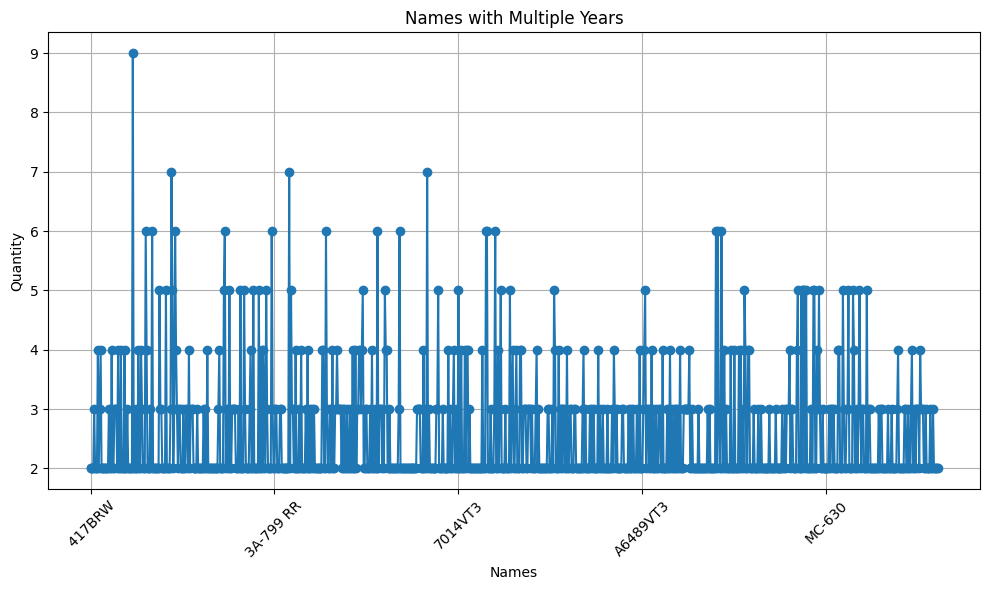

In [61]:
dataset = corn
name_counts = dataset.groupby('NAME')['YEAR'].nunique()
names_with_multiple_years = name_counts[name_counts > 1]

# Plotting the line graph
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
names_with_multiple_years.plot(kind='line', marker='o')

plt.title('Names with Multiple Years')
plt.xlabel('Names')
plt.ylabel('Quantity')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

print("Name with the maximum quantity:", names_with_multiple_years.idxmax())
plt.show()